In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install mmcv-full -f https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
!git clone https://github.com/open-mmlab/mmsegmentation.git

Looking in links: https://download.openmmlab.com/mmcv/dist/cu111/torch1.10.0/index.html
     |████████████████████████████████| 46.6 MB 1.6 MB/s 
     |████████████████████████████████| 190 kB 4.2 MB/s 
Cloning into 'mmsegmentation'...
remote: Enumerating objects: 7033, done.
remote: Counting objects: 100% (45/45), done.
remote: Compressing objects: 100% (36/36), done.
remote: Total 7033 (delta 13), reused 31 (delta 9), pack-reused 6988
Receiving objects: 100% (7033/7033), 13.68 MiB | 12.10 MiB/s, done.
Resolving deltas: 100% (5180/5180), done.


In [3]:
import torch

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Setup complete. Using torch 1.11.0+cu113 (Tesla P100-PCIE-16GB)


In [4]:
%cd mmsegmentation

/content/mmsegmentation


In [5]:
from mmseg.apis import inference_segmentor, init_segmentor, show_result_pyplot
import mmcv

In [6]:
import os.path as osp
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt

In [7]:
!mkdir checkpoints
!wget -O //content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth

--2022-05-20 08:56:16--  https://download.openmmlab.com/mmsegmentation/v0.5/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
Resolving download.openmmlab.com (download.openmmlab.com)... 47.75.20.18
Connecting to download.openmmlab.com (download.openmmlab.com)|47.75.20.18|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 328290585 (313M) [application/octet-stream]
Saving to: ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’

//content/mmsegment 100%[===================>] 313.08M  15.5MB/s    in 23s     

2022-05-20 08:56:39 (13.8 MB/s) - ‘//content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth’ saved [328290585/328290585]



In [8]:
from mmseg.datasets.builder import DATASETS
from mmseg.datasets.custom import CustomDataset

classes = ('background', 'building')
palette = [[0, 0, 0], [0, 0, 128]]

@DATASETS.register_module()
class SIADataset(CustomDataset):
  CLASSES = classes
  PALETTE = palette
  def __init__(self, split, **kwargs):
    super().__init__(img_suffix='.png', seg_map_suffix='.png', 
                     split=split, **kwargs)
    assert osp.exists(self.img_dir) and self.split is not None

In [9]:
# config 파일을 설정하고, 다운로드 받은 pretrained 모델을 checkpoint로 설정. 
config_file = '/content/mmsegmentation/configs/segformer/segformer_mit-b5_8x1_1024x1024_160k_cityscapes.py'
checkpoint_file = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

from mmcv import Config

cfg = Config.fromfile(config_file)
print(cfg.pretty_text)

norm_cfg = dict(type='SyncBN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=19,
        norm_cfg=dict(type='SyncBN', requires_grad=True),
        align_corners=False,
        loss_decode=dict(
            type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0)),
    train_cf

In [10]:
cfg.norm_cfg = dict(type='BN', requires_grad=True)
#cfg.model.backbone.norm_cfg = cfg.norm_cfg
cfg.model.decode_head.norm_cfg = cfg.norm_cfg

cfg.model.decode_head.num_classes = 2

cfg.model.decode_head.loss_decode = [dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
                                     dict(type='DiceLoss', loss_weight = 1.0)]

In [11]:
cfg.img_norm_cfg = dict(
    mean=[123.675, 116.28, 103.53], std=[58.395, 57.12, 57.375], to_rgb=True)
cfg.crop_size = (512, 512)
cfg.train_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(type='LoadAnnotations'),
    dict(type='Resize', img_scale=(1024, 1024), ratio_range=(0.5, 2.0)),
    dict(type='RandomCrop', crop_size=cfg.crop_size, cat_max_ratio=0.75),
    dict(type='RandomFlip', flip_ratio=0.5),
    dict(type='PhotoMetricDistortion'),
    dict(type='Normalize', **cfg.img_norm_cfg),
    dict(type='Pad', size=cfg.crop_size, pad_val=0, seg_pad_val=255),
    dict(type='DefaultFormatBundle'),
    dict(type='Collect', keys=['img', 'gt_semantic_seg']),
]

cfg.val_pipeline = [
                    dict(type='LoadImageFromFile'),
                    dict(
                        type='MultiScaleFlipAug',
                        img_scale=(1024, 1024),
                        flip=False,
                        transforms=[
                                    dict(type='Resize', keep_ratio=True),
                                    dict(type='RandomFlip'),
                                    dict(
                                        type='Normalize',
                                        mean=[123.675, 116.28, 103.53],
                                        std=[58.395, 57.12, 57.375],
                                        to_rgb=True),
                                    dict(type='ImageToTensor', keys=['img']),
                                    dict(type='Collect', keys=['img'])
                                    ]),
                    
]

cfg.test_pipeline = [
    dict(type='LoadImageFromFile'),
    dict(
        type='MultiScaleFlipAug',
        img_scale=(1024, 1024),
        img_ratios=[0.5, 0.75, 1.0, 1.25, 1.5, 1.75],
        flip=False,
        transforms=[
            dict(type='Resize', keep_ratio=True),
            #dict(type='ResizeToMultiple', size_divisor=32),
            dict(type='RandomFlip'),
            dict(type='Normalize', **cfg.img_norm_cfg),
            dict(type='ImageToTensor', keys=['img']),
            dict(type='Collect', keys=['img']),
        ])
]

In [12]:
cfg.dataset_type = 'SIADataset'
cfg.data_root = '/content/drive/MyDrive/SIA'

cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'

cfg.data.val.type = 'SIADataset'
cfg.data.val.data_root = '/content/drive/MyDrive/SIA'
cfg.data.val.img_dir = 'Data_set/building_dataset/img_dir/train'
cfg.data.val.ann_dir = 'Data_set/building_dataset/ann_dir/train'
cfg.data.val.pipeline = cfg.test_pipeline
cfg.data.val.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_val_building.txt'

cfg.data.test.type = 'SIADataset'
cfg.data.test.data_root = '/content/drive/MyDrive/SIA'
cfg.data.test.img_dir = 'Data_set/building_dataset/img_dir/val'
cfg.data.test.ann_dir = 'Data_set/building_dataset/ann_dir/val'
cfg.data.test.pipeline = cfg.test_pipeline
cfg.data.test.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/val/up.txt'

<pre><code>cfg.data.train.type = 'SIADataset'
cfg.data.train.data_root = '/content/drive/MyDrive/SIA'
cfg.data.train.img_dir = 'Data_set/building_dataset/img_dir'
cfg.data.train.ann_dir = 'Data_set/building_dataset/ann_dir'
cfg.data.train.pipeline = cfg.train_pipeline
cfg.data.train.split = '/content/drive/MyDrive/SIA/Data_set/building_dataset/mask_dir/train/up_train_building.txt'
</code></pre>

In [13]:
cfg.load_from = '/content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth'

# Set up working dir to save files and logs.
cfg.work_dir = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice'

In [14]:
cfg.runner.max_iteTrs = 200
cfg.log_config.interval = 100
cfg.evaluation.interval = 1000  # 모델 학습시 평가를 몇 번째 iteration마다 할 것인지 지정
cfg.checkpoint_config.interval = 1000  # 모델 학습시 학습한 모델을 몇 번째 iteration마다 저장할 것인지 지정

cfg.runner = dict(type='IterBasedRunner', max_iters=20000)  # Iteration으로 동작, Epoch로 동작하게 변경할 수도 있음
# cfg.runner = dict(type='EpochBasedRunner', max_epochs=4000)  # Epoch로 변경
cfg.workflow = [('train', 1)]

# Set seed to facitate reproducing the result
cfg.seed = 0
#set_random_seed(0, deterministic=False)
cfg.gpu_ids = range(1)

# Let's have a look at the final config used for training
print(f'Config:\n{cfg.pretty_text}')

Config:
norm_cfg = dict(type='BN', requires_grad=True)
model = dict(
    type='EncoderDecoder',
    pretrained=None,
    backbone=dict(
        type='MixVisionTransformer',
        in_channels=3,
        embed_dims=64,
        num_stages=4,
        num_layers=[3, 6, 40, 3],
        num_heads=[1, 2, 5, 8],
        patch_sizes=[7, 3, 3, 3],
        sr_ratios=[8, 4, 2, 1],
        out_indices=(0, 1, 2, 3),
        mlp_ratio=4,
        qkv_bias=True,
        drop_rate=0.0,
        attn_drop_rate=0.0,
        drop_path_rate=0.1,
        init_cfg=dict(type='Pretrained', checkpoint='pretrain/mit_b5.pth')),
    decode_head=dict(
        type='SegformerHead',
        in_channels=[64, 128, 320, 512],
        in_index=[0, 1, 2, 3],
        channels=256,
        dropout_ratio=0.1,
        num_classes=2,
        norm_cfg=dict(type='BN', requires_grad=True),
        align_corners=False,
        loss_decode=[
            dict(type='CrossEntropyLoss', use_sigmoid=False, loss_weight=1.0),
            d

### 모델 학습

In [15]:
from mmseg.datasets import build_dataset
from mmseg.models import build_segmentor
from mmseg.apis import train_segmentor

# Build the dataset
datasets = [build_dataset(cfg.data.train)]

# Build the detector
model = build_segmentor(
    cfg.model, train_cfg=cfg.get('train_cfg'), test_cfg=cfg.get('test_cfg'))

# Add an attribute for visualization convenience
model.CLASSES = datasets[0].CLASSES

# Create work_dir
mmcv.mkdir_or_exist(osp.abspath(cfg.work_dir))
train_segmentor(model, datasets, cfg, distributed=False, validate=True,
                meta=dict(CLASSES=classes, PALETTE=palette))

2022-05-20 08:56:43,954 - mmseg - INFO - Loaded 537 images
/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '
2022-05-20 08:56:58,670 - mmseg - INFO - Loaded 113 images
2022-05-20 08:56:58,673 - mmseg - INFO - load checkpoint from local path: /content/mmsegmentation/checkpoints/segformer_mit-b5_8x1_1024x1024_160k_cityscapes_20211206_072934-87a052ec.pth
2022-05-20 08:56:59,186 - mmseg - WARNING - The model and loaded state dict do not match exactly

size mismatch for decode_head.conv_seg.weight: copying a param with shape torch.Size([19, 256, 1, 1]) from checkpoint, the shape in current model is torch.Size([2, 256, 1, 1]).
size mismatch for decode_head.conv_seg.bias: copying a param with 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.2 task/s, elapsed: 517s, ETA:     0s

2022-05-20 09:22:23,918 - mmseg - INFO - per class results:
2022-05-20 09:22:23,920 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.69 |  95.0 |
|  building  | 74.76 | 82.57 |
+------------+-------+-------+
2022-05-20 09:22:23,922 - mmseg - INFO - Summary:
2022-05-20 09:22:23,924 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 90.98 | 81.23 | 88.79 |
+-------+-------+-------+
2022-05-20 09:22:23,926 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9098, mIoU: 0.8123, mAcc: 0.8879, IoU.background: 0.8769, IoU.building: 0.7476, Acc.background: 0.9500, Acc.building: 0.8257
2022-05-20 09:23:05,546 - mmseg - INFO - Iter [1100/20000]	lr: 4.154e-05, eta: 7:28:31, time: 5.590, data_time: 5.202, memory: 3323, decode.loss_ce: 0.2790, decode.loss_dice: 0.1070, decode.acc_seg: 88.5622, loss: 0.3859
2022-05-20 09:23:44,990 - mmseg - INFO - Iter [1200/20000]	lr: 4.508e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 09:36:23,491 - mmseg - INFO - per class results:
2022-05-20 09:36:23,492 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 87.31 | 90.85 |
|  building  | 76.82 | 91.52 |
+------------+-------+-------+
2022-05-20 09:36:23,494 - mmseg - INFO - Summary:
2022-05-20 09:36:23,496 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 91.07 | 82.07 | 91.18 |
+-------+-------+-------+
2022-05-20 09:36:23,499 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9107, mIoU: 0.8207, mAcc: 0.9118, IoU.background: 0.8731, IoU.building: 0.7682, Acc.background: 0.9085, Acc.building: 0.9152
2022-05-20 09:37:02,883 - mmseg - INFO - Iter [2100/20000]	lr: 5.370e-05, eta: 5:41:27, time: 4.714, data_time: 4.326, memory: 3323, decode.loss_ce: 0.2187, decode.loss_dice: 0.0827, decode.acc_seg: 91.0569, loss: 0.3014
2022-05-20 09:37:44,392 - mmseg - INFO - Iter [2200/20000]	lr: 5.340e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 09:50:20,701 - mmseg - INFO - per class results:
2022-05-20 09:50:20,702 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  89.3 | 94.44 |
|  building  | 78.82 | 87.99 |
+------------+-------+-------+
2022-05-20 09:50:20,704 - mmseg - INFO - Summary:
2022-05-20 09:50:20,706 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.35 | 84.06 | 91.21 |
+-------+-------+-------+
2022-05-20 09:50:20,708 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9235, mIoU: 0.8406, mAcc: 0.9121, IoU.background: 0.8930, IoU.building: 0.7882, Acc.background: 0.9444, Acc.building: 0.8799
2022-05-20 09:51:00,268 - mmseg - INFO - Iter [3100/20000]	lr: 5.070e-05, eta: 4:54:28, time: 4.716, data_time: 4.327, memory: 3323, decode.loss_ce: 0.2214, decode.loss_dice: 0.0841, decode.acc_seg: 90.8953, loss: 0.3055
2022-05-20 09:51:39,782 - mmseg - INFO - Iter [3200/20000]	lr: 5.040e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 10:04:18,850 - mmseg - INFO - per class results:
2022-05-20 10:04:18,852 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 89.95 | 96.96 |
|  building  |  78.7 | 83.71 |
+------------+-------+-------+
2022-05-20 10:04:18,853 - mmseg - INFO - Summary:
2022-05-20 10:04:18,855 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 92.67 | 84.33 | 90.33 |
+-------+-------+-------+
2022-05-20 10:04:18,856 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9267, mIoU: 0.8433, mAcc: 0.9033, IoU.background: 0.8995, IoU.building: 0.7870, Acc.background: 0.9696, Acc.building: 0.8371
2022-05-20 10:04:58,326 - mmseg - INFO - Iter [4100/20000]	lr: 4.770e-05, eta: 4:23:38, time: 4.714, data_time: 4.326, memory: 3323, decode.loss_ce: 0.2188, decode.loss_dice: 0.0844, decode.acc_seg: 91.1705, loss: 0.3032
2022-05-20 10:05:37,778 - mmseg - INFO - Iter [4200/20000]	lr: 4.740e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 10:18:15,320 - mmseg - INFO - per class results:
2022-05-20 10:18:15,322 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  90.4 | 96.17 |
|  building  | 80.24 | 86.66 |
+------------+-------+-------+
2022-05-20 10:18:15,324 - mmseg - INFO - Summary:
2022-05-20 10:18:15,326 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.09 | 85.32 | 91.42 |
+-------+-------+-------+
2022-05-20 10:18:15,329 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9309, mIoU: 0.8532, mAcc: 0.9142, IoU.background: 0.9040, IoU.building: 0.8024, Acc.background: 0.9617, Acc.building: 0.8666
2022-05-20 10:18:54,897 - mmseg - INFO - Iter [5100/20000]	lr: 4.470e-05, eta: 3:59:21, time: 4.716, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1953, decode.loss_dice: 0.0764, decode.acc_seg: 92.0693, loss: 0.2716
2022-05-20 10:19:34,404 - mmseg - INFO - Iter [5200/20000]	lr: 4.440e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 10:32:13,481 - mmseg - INFO - per class results:
2022-05-20 10:32:13,483 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.47 | 95.86 |
|  building  | 80.57 | 87.55 |
+------------+-------+-------+
2022-05-20 10:32:13,484 - mmseg - INFO - Summary:
2022-05-20 10:32:13,486 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.17 | 85.52 | 91.7 |
+-------+-------+------+
2022-05-20 10:32:13,489 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9317, mIoU: 0.8552, mAcc: 0.9170, IoU.background: 0.9047, IoU.building: 0.8057, Acc.background: 0.9586, Acc.building: 0.8755
2022-05-20 10:32:53,179 - mmseg - INFO - Iter [6100/20000]	lr: 4.170e-05, eta: 3:38:31, time: 4.718, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1890, decode.loss_dice: 0.0719, decode.acc_seg: 92.4379, loss: 0.2609
2022-05-20 10:33:32,673 - mmseg - INFO - Iter [6200/20000]	lr: 4.140e-05, eta: 3:34:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 10:46:10,809 - mmseg - INFO - per class results:
2022-05-20 10:46:10,811 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.45 | 94.25 |
|  building  | 81.43 | 91.22 |
+------------+-------+-------+
2022-05-20 10:46:10,812 - mmseg - INFO - Summary:
2022-05-20 10:46:10,815 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.27 | 85.94 | 92.73 |
+-------+-------+-------+
2022-05-20 10:46:10,820 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9327, mIoU: 0.8594, mAcc: 0.9273, IoU.background: 0.9045, IoU.building: 0.8143, Acc.background: 0.9425, Acc.building: 0.9122
2022-05-20 10:46:50,296 - mmseg - INFO - Iter [7100/20000]	lr: 3.870e-05, eta: 3:19:35, time: 4.715, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1683, decode.loss_dice: 0.0619, decode.acc_seg: 93.0094, loss: 0.2302
2022-05-20 10:47:29,833 - mmseg - INFO - Iter [7200/20000]	lr: 3.840e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 11:00:05,968 - mmseg - INFO - per class results:
2022-05-20 11:00:05,969 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.67 | 94.93 |
|  building  | 81.53 | 90.17 |
+------------+-------+-------+
2022-05-20 11:00:05,971 - mmseg - INFO - Summary:
2022-05-20 11:00:05,974 - mmseg - INFO - 
+-------+------+-------+
|  aAcc | mIoU |  mAcc |
+-------+------+-------+
| 93.39 | 86.1 | 92.55 |
+-------+------+-------+
2022-05-20 11:00:05,976 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9339, mIoU: 0.8610, mAcc: 0.9255, IoU.background: 0.9067, IoU.building: 0.8153, Acc.background: 0.9493, Acc.building: 0.9017
2022-05-20 11:00:47,712 - mmseg - INFO - Iter [8100/20000]	lr: 3.570e-05, eta: 3:01:53, time: 4.738, data_time: 4.348, memory: 3323, decode.loss_ce: 0.1743, decode.loss_dice: 0.0633, decode.acc_seg: 92.8380, loss: 0.2376
2022-05-20 11:01:27,465 - mmseg - INFO - Iter [8200/20000]	lr: 3.540e-05, eta: 2:59:

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 11:14:04,338 - mmseg - INFO - per class results:
2022-05-20 11:14:04,340 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.76 | 95.66 |
|  building  | 81.32 | 88.71 |
+------------+-------+-------+
2022-05-20 11:14:04,342 - mmseg - INFO - Summary:
2022-05-20 11:14:04,343 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.41 | 86.04 | 92.18 |
+-------+-------+-------+
2022-05-20 11:14:04,347 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9341, mIoU: 0.8604, mAcc: 0.9218, IoU.background: 0.9076, IoU.building: 0.8132, Acc.background: 0.9566, Acc.building: 0.8871
2022-05-20 11:14:44,009 - mmseg - INFO - Iter [9100/20000]	lr: 3.270e-05, eta: 2:44:59, time: 4.719, data_time: 4.329, memory: 3323, decode.loss_ce: 0.1589, decode.loss_dice: 0.0592, decode.acc_seg: 93.4495, loss: 0.2182
2022-05-20 11:15:25,772 - mmseg - INFO - Iter [9200/20000]	lr: 3.240e-05, eta: 

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 11:28:02,931 - mmseg - INFO - per class results:
2022-05-20 11:28:02,933 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.16 | 95.92 |
|  building  | 82.08 | 89.07 |
+------------+-------+-------+
2022-05-20 11:28:02,936 - mmseg - INFO - Summary:
2022-05-20 11:28:02,938 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.71 | 86.62 | 92.5 |
+-------+-------+------+
2022-05-20 11:28:02,940 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9371, mIoU: 0.8662, mAcc: 0.9250, IoU.background: 0.9116, IoU.building: 0.8208, Acc.background: 0.9592, Acc.building: 0.8907
2022-05-20 11:28:42,669 - mmseg - INFO - Iter [10100/20000]	lr: 2.970e-05, eta: 2:28:43, time: 4.719, data_time: 4.328, memory: 3323, decode.loss_ce: 0.1612, decode.loss_dice: 0.0609, decode.acc_seg: 93.2052, loss: 0.2220
2022-05-20 11:29:22,388 - mmseg - INFO - Iter [10200/20000]	lr: 2.940e-05, eta: 2:2

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 11:42:00,808 - mmseg - INFO - per class results:
2022-05-20 11:42:00,810 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.15 | 95.43 |
|  building  | 82.31 | 90.18 |
+------------+-------+-------+
2022-05-20 11:42:00,811 - mmseg - INFO - Summary:
2022-05-20 11:42:00,814 - mmseg - INFO - 
+-------+-------+------+
|  aAcc |  mIoU | mAcc |
+-------+-------+------+
| 93.73 | 86.73 | 92.8 |
+-------+-------+------+
2022-05-20 11:42:00,816 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9373, mIoU: 0.8673, mAcc: 0.9280, IoU.background: 0.9115, IoU.building: 0.8231, Acc.background: 0.9543, Acc.building: 0.9018
2022-05-20 11:42:40,576 - mmseg - INFO - Iter [11100/20000]	lr: 2.670e-05, eta: 2:12:50, time: 4.718, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1562, decode.loss_dice: 0.0627, decode.acc_seg: 93.4493, loss: 0.2189
2022-05-20 11:43:20,155 - mmseg - INFO - Iter [11200/20000]	lr: 2.640e-05, eta: 2:1

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 11:55:58,351 - mmseg - INFO - per class results:
2022-05-20 11:55:58,354 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 90.94 | 94.41 |
|  building  | 82.39 | 92.02 |
+------------+-------+-------+
2022-05-20 11:55:58,355 - mmseg - INFO - Summary:
2022-05-20 11:55:58,360 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.64 | 86.67 | 93.22 |
+-------+-------+-------+
2022-05-20 11:55:58,362 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9364, mIoU: 0.8667, mAcc: 0.9322, IoU.background: 0.9094, IoU.building: 0.8239, Acc.background: 0.9441, Acc.building: 0.9202
2022-05-20 11:56:38,046 - mmseg - INFO - Iter [12100/20000]	lr: 2.370e-05, eta: 1:57:17, time: 4.717, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1400, decode.loss_dice: 0.0536, decode.acc_seg: 94.1536, loss: 0.1936
2022-05-20 11:57:17,728 - mmseg - INFO - Iter [12200/20000]	lr: 2.340e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 12:09:57,298 - mmseg - INFO - per class results:
2022-05-20 12:09:57,300 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.08 | 94.67 |
|  building  | 82.56 | 91.76 |
+------------+-------+-------+
2022-05-20 12:09:57,302 - mmseg - INFO - Summary:
2022-05-20 12:09:57,306 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.73 | 86.82 | 93.22 |
+-------+-------+-------+
2022-05-20 12:09:57,308 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9373, mIoU: 0.8682, mAcc: 0.9322, IoU.background: 0.9108, IoU.building: 0.8256, Acc.background: 0.9467, Acc.building: 0.9176
2022-05-20 12:10:36,895 - mmseg - INFO - Iter [13100/20000]	lr: 2.070e-05, eta: 1:41:59, time: 4.717, data_time: 4.328, memory: 3323, decode.loss_ce: 0.1412, decode.loss_dice: 0.0528, decode.acc_seg: 94.1346, loss: 0.1940
2022-05-20 12:11:16,615 - mmseg - INFO - Iter [13200/20000]	lr: 2.040e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 12:23:54,966 - mmseg - INFO - per class results:
2022-05-20 12:23:54,969 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.33 | 95.29 |
|  building  | 82.78 | 90.93 |
+------------+-------+-------+
2022-05-20 12:23:54,970 - mmseg - INFO - Summary:
2022-05-20 12:23:54,972 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.88 | 87.05 | 93.11 |
+-------+-------+-------+
2022-05-20 12:23:54,974 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9388, mIoU: 0.8705, mAcc: 0.9311, IoU.background: 0.9133, IoU.building: 0.8278, Acc.background: 0.9529, Acc.building: 0.9093
2022-05-20 12:24:34,643 - mmseg - INFO - Iter [14100/20000]	lr: 1.770e-05, eta: 1:26:51, time: 4.717, data_time: 4.327, memory: 3323, decode.loss_ce: 0.1407, decode.loss_dice: 0.0548, decode.acc_seg: 94.0643, loss: 0.1956
2022-05-20 12:25:14,357 - mmseg - INFO - Iter [14200/20000]	lr: 1.740e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 12:37:50,693 - mmseg - INFO - per class results:
2022-05-20 12:37:50,694 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.31 | 95.93 |
|  building  | 82.41 | 89.42 |
+------------+-------+-------+
2022-05-20 12:37:50,695 - mmseg - INFO - Summary:
2022-05-20 12:37:50,697 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.83 | 86.86 | 92.68 |
+-------+-------+-------+
2022-05-20 12:37:50,701 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9383, mIoU: 0.8686, mAcc: 0.9268, IoU.background: 0.9131, IoU.building: 0.8241, Acc.background: 0.9593, Acc.building: 0.8942
2022-05-20 12:38:32,382 - mmseg - INFO - Iter [15100/20000]	lr: 1.470e-05, eta: 1:11:53, time: 4.737, data_time: 4.347, memory: 3323, decode.loss_ce: 0.1558, decode.loss_dice: 0.0586, decode.acc_seg: 93.4787, loss: 0.2144
2022-05-20 12:39:12,082 - mmseg - INFO - Iter [15200/20000]	lr: 1.440e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 12:51:48,277 - mmseg - INFO - per class results:
2022-05-20 12:51:48,279 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background |  91.3 | 95.46 |
|  building  | 82.62 | 90.47 |
+------------+-------+-------+
2022-05-20 12:51:48,281 - mmseg - INFO - Summary:
2022-05-20 12:51:48,284 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.84 | 86.96 | 92.96 |
+-------+-------+-------+
2022-05-20 12:51:48,287 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9384, mIoU: 0.8696, mAcc: 0.9296, IoU.background: 0.9130, IoU.building: 0.8262, Acc.background: 0.9546, Acc.building: 0.9047
2022-05-20 12:52:28,094 - mmseg - INFO - Iter [16100/20000]	lr: 1.170e-05, eta: 0:57:02, time: 4.720, data_time: 4.329, memory: 3323, decode.loss_ce: 0.1393, decode.loss_dice: 0.0521, decode.acc_seg: 94.1056, loss: 0.1914
2022-05-20 12:53:09,808 - mmseg - INFO - Iter [16200/20000]	lr: 1.140e-05, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 13:05:47,272 - mmseg - INFO - per class results:
2022-05-20 13:05:47,273 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.41 | 95.29 |
|  building  | 82.95 | 91.13 |
+------------+-------+-------+
2022-05-20 13:05:47,275 - mmseg - INFO - Summary:
2022-05-20 13:05:47,277 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 93.94 | 87.18 | 93.21 |
+-------+-------+-------+
2022-05-20 13:05:47,280 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9394, mIoU: 0.8718, mAcc: 0.9321, IoU.background: 0.9141, IoU.building: 0.8295, Acc.background: 0.9529, Acc.building: 0.9113
2022-05-20 13:06:26,945 - mmseg - INFO - Iter [17100/20000]	lr: 8.703e-06, eta: 0:42:18, time: 4.718, data_time: 4.328, memory: 3323, decode.loss_ce: 0.1410, decode.loss_dice: 0.0580, decode.acc_seg: 94.0688, loss: 0.1989
2022-05-20 13:07:08,769 - mmseg - INFO - Iter [17200/20000]	lr: 8.403e-06, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 432s, ETA:     0s

2022-05-20 13:19:44,761 - mmseg - INFO - per class results:
2022-05-20 13:19:44,763 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.54 |  95.6 |
|  building  | 83.08 | 90.72 |
+------------+-------+-------+
2022-05-20 13:19:44,764 - mmseg - INFO - Summary:
2022-05-20 13:19:44,766 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.02 | 87.31 | 93.16 |
+-------+-------+-------+
2022-05-20 13:19:44,768 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9402, mIoU: 0.8731, mAcc: 0.9316, IoU.background: 0.9154, IoU.building: 0.8308, Acc.background: 0.9560, Acc.building: 0.9072
2022-05-20 13:20:24,389 - mmseg - INFO - Iter [18100/20000]	lr: 5.703e-06, eta: 0:27:39, time: 4.716, data_time: 4.326, memory: 3323, decode.loss_ce: 0.1380, decode.loss_dice: 0.0522, decode.acc_seg: 94.3051, loss: 0.1903
2022-05-20 13:21:04,146 - mmseg - INFO - Iter [18200/20000]	lr: 5.403e-06, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 13:33:44,913 - mmseg - INFO - per class results:
2022-05-20 13:33:44,916 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.61 | 95.77 |
|  building  | 83.14 |  90.5 |
+------------+-------+-------+
2022-05-20 13:33:44,917 - mmseg - INFO - Summary:
2022-05-20 13:33:44,918 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.06 | 87.37 | 93.13 |
+-------+-------+-------+
2022-05-20 13:33:44,921 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9406, mIoU: 0.8737, mAcc: 0.9313, IoU.background: 0.9161, IoU.building: 0.8314, Acc.background: 0.9577, Acc.building: 0.9050
2022-05-20 13:34:24,697 - mmseg - INFO - Iter [19100/20000]	lr: 2.703e-06, eta: 0:13:04, time: 4.737, data_time: 4.346, memory: 3323, decode.loss_ce: 0.1525, decode.loss_dice: 0.0548, decode.acc_seg: 93.7680, loss: 0.2073
2022-05-20 13:35:04,356 - mmseg - INFO - Iter [19200/20000]	lr: 2.403e-06, eta

[>>>>>>>>>>>>>>>>>>>>>>>>>>>>>] 113/113, 0.3 task/s, elapsed: 434s, ETA:     0s

2022-05-20 13:47:45,178 - mmseg - INFO - per class results:
2022-05-20 13:47:45,180 - mmseg - INFO - 
+------------+-------+-------+
|   Class    |  IoU  |  Acc  |
+------------+-------+-------+
| background | 91.58 | 95.48 |
|  building  | 83.23 |  91.1 |
+------------+-------+-------+
2022-05-20 13:47:45,181 - mmseg - INFO - Summary:
2022-05-20 13:47:45,187 - mmseg - INFO - 
+-------+-------+-------+
|  aAcc |  mIoU |  mAcc |
+-------+-------+-------+
| 94.06 | 87.41 | 93.29 |
+-------+-------+-------+
2022-05-20 13:47:45,188 - mmseg - INFO - Iter(val) [113]	aAcc: 0.9406, mIoU: 0.8741, mAcc: 0.9329, IoU.background: 0.9158, IoU.building: 0.8323, Acc.background: 0.9548, Acc.building: 0.9110


### 모델 결과 시각화

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


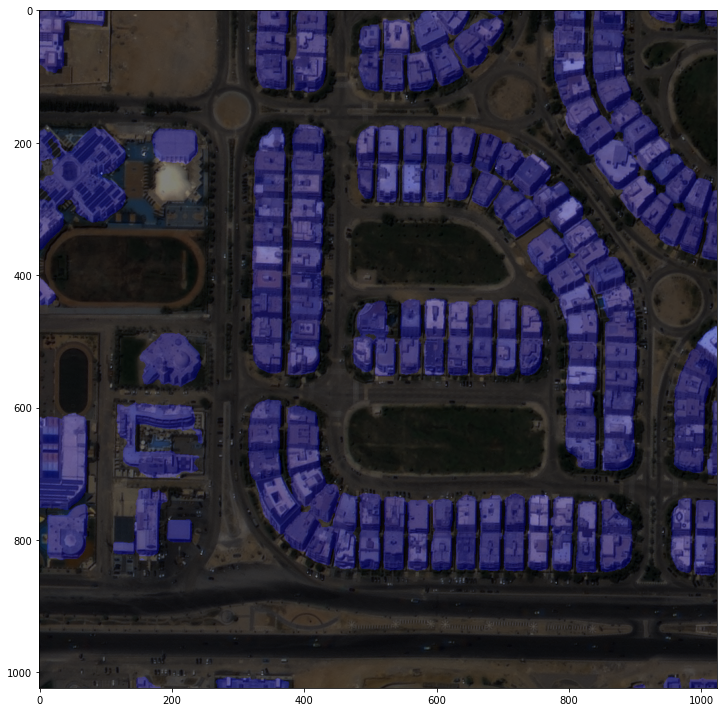

In [16]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00051_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


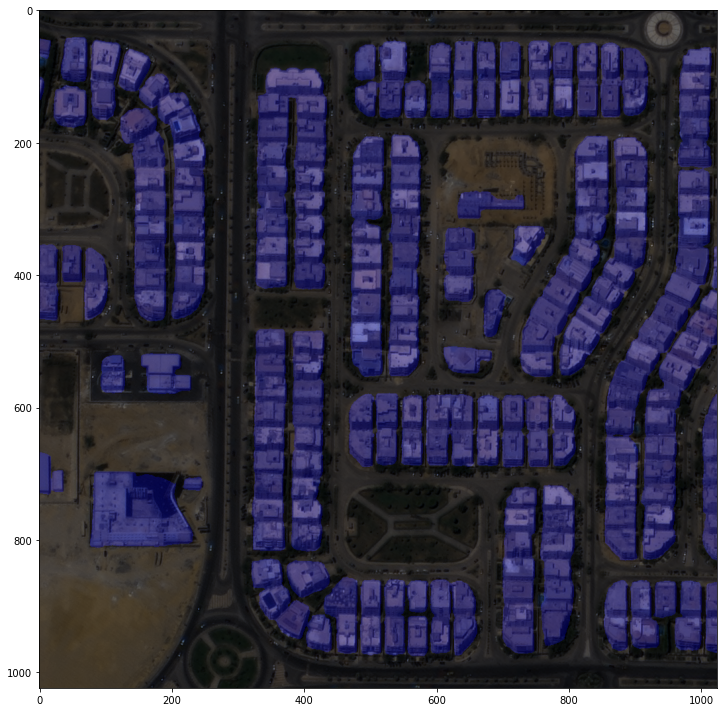

In [17]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00126_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


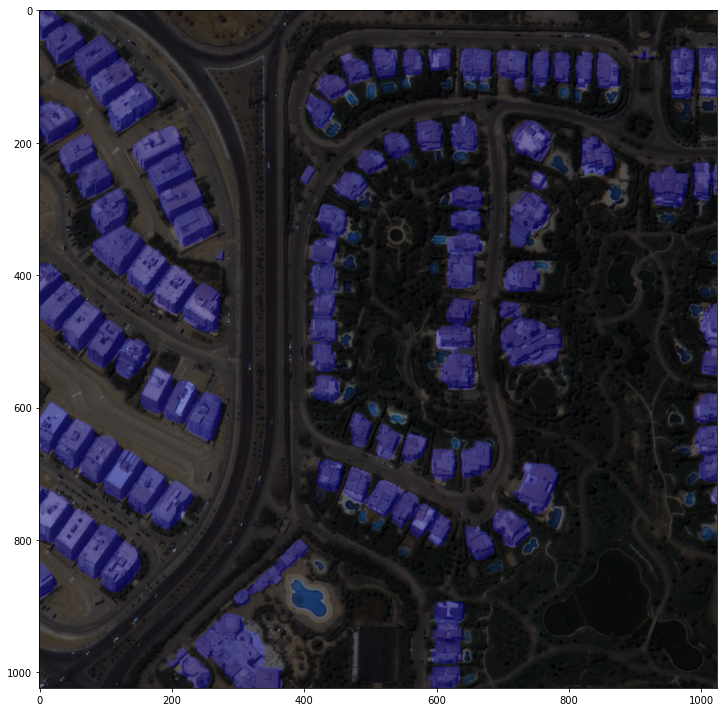

In [18]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00226_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


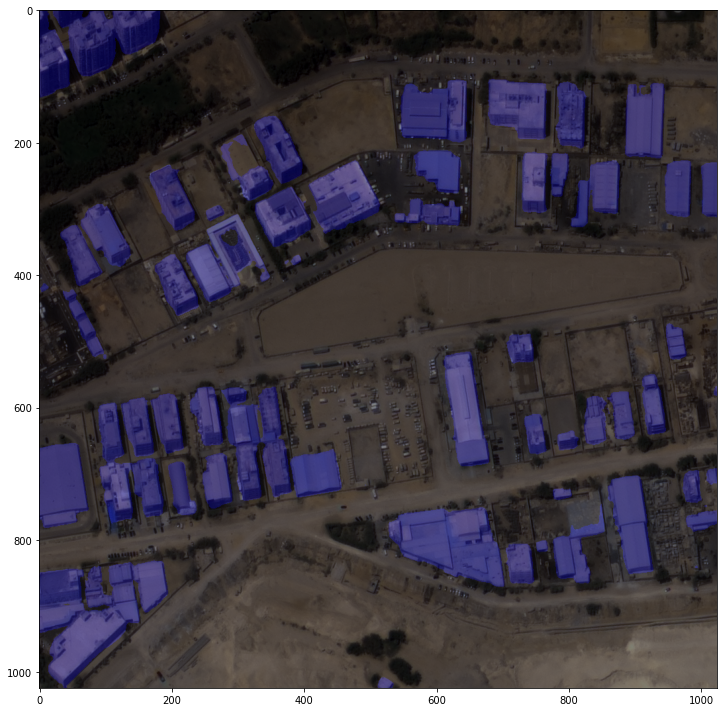

In [19]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00333_PS3_K3A_NIA0276.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


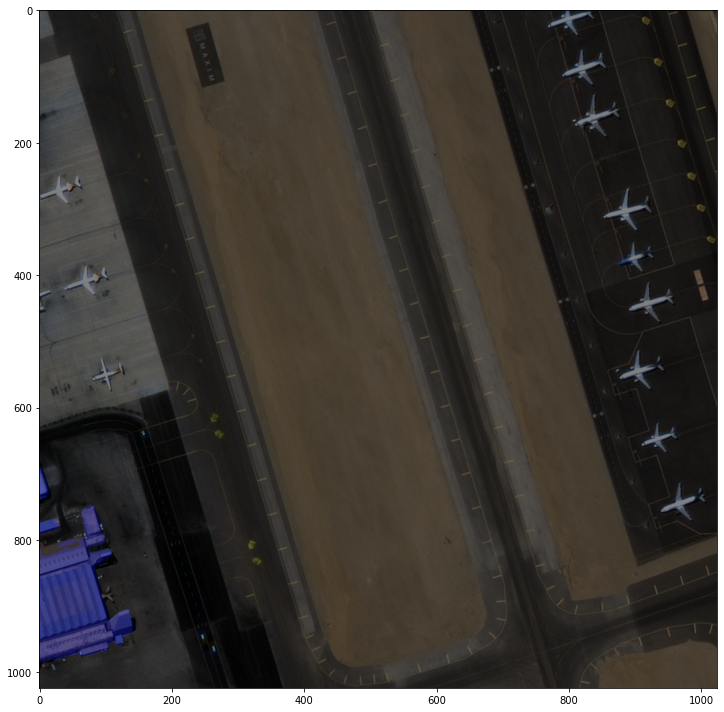

In [20]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD00697_PS3_K3A_NIA0277.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


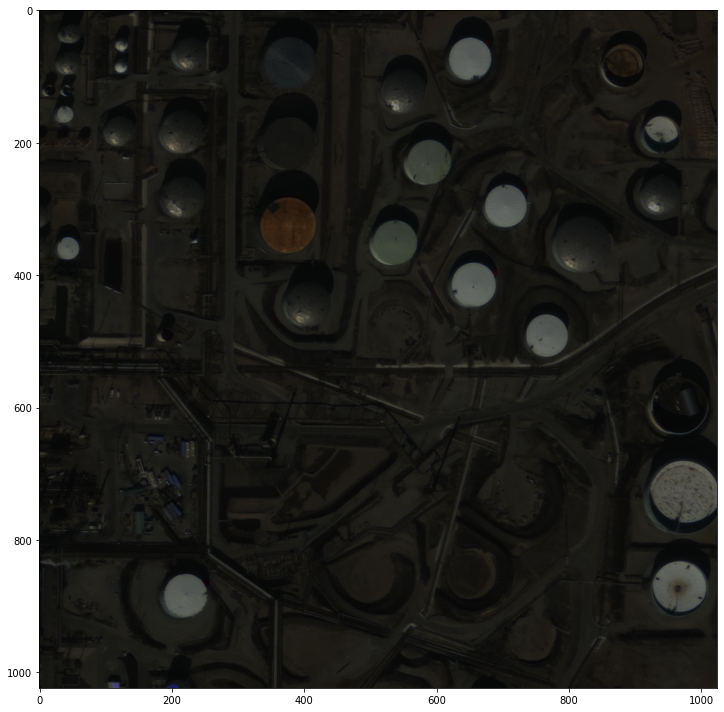

In [21]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD04404_PS3_K3A_NIA0378.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


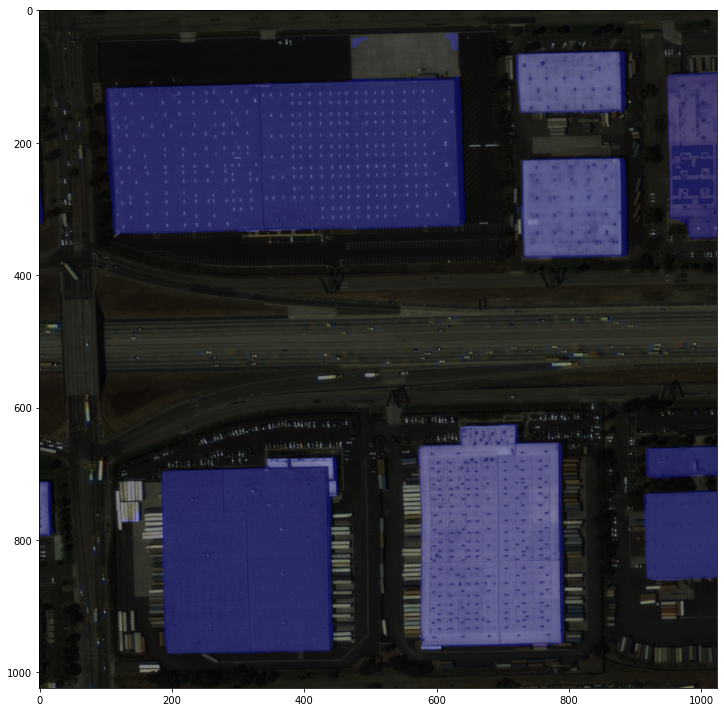

In [22]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/BLD10921_PS3_K3A_NIA0389.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


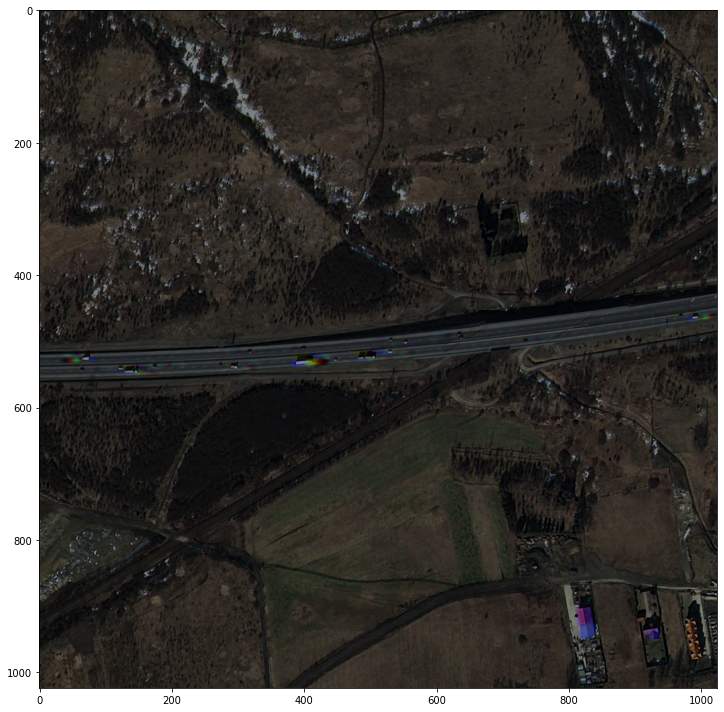

In [23]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ00176_PS3_K3_NIA0081.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


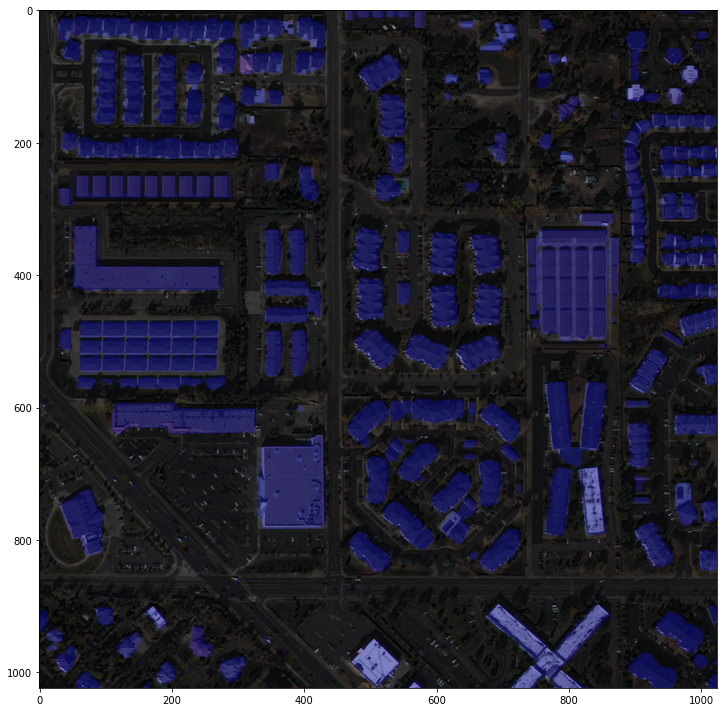

In [24]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ01050_PS3_K3_NIA0089.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


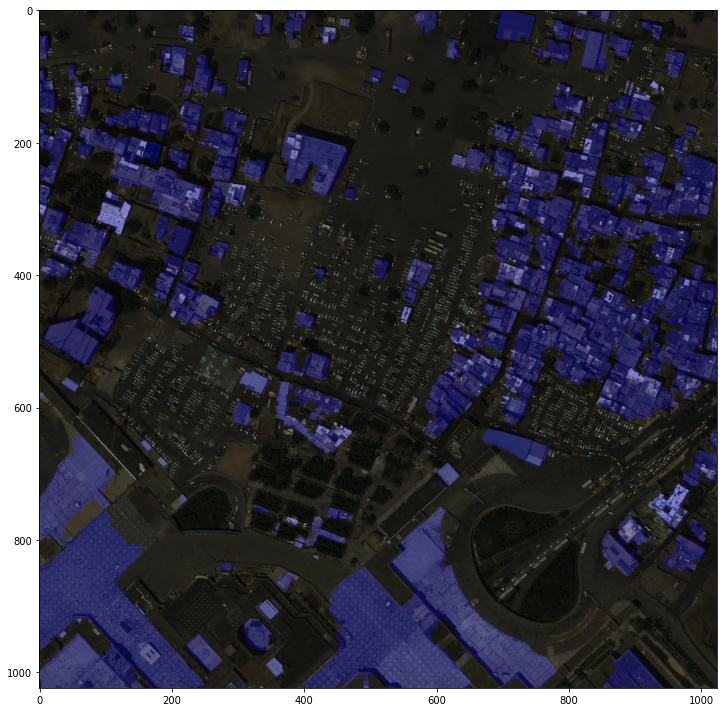

In [25]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/Data_set/building_dataset/img_dir/val/OBJ03670_PS3_K3A_NIA0153.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

#### 네이버 지도 이미지로 테스트

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


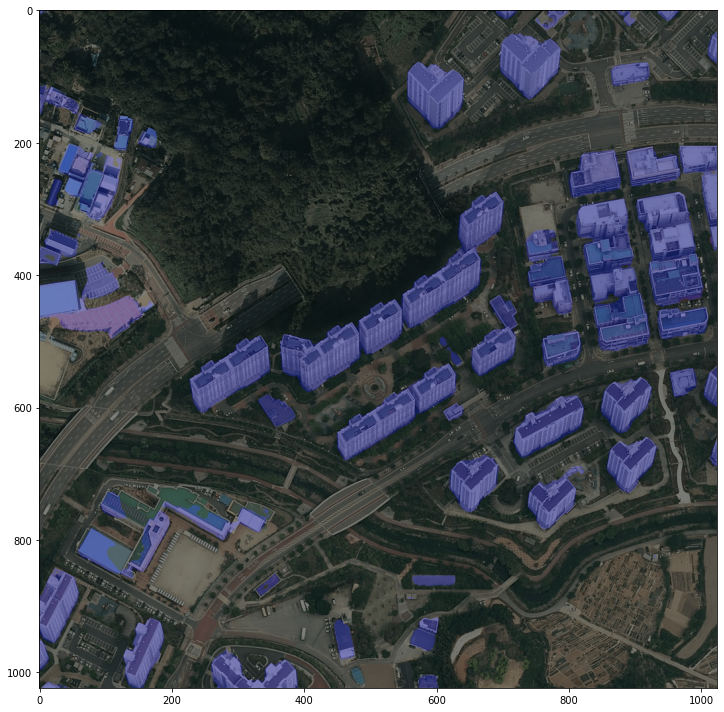

In [26]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0000.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


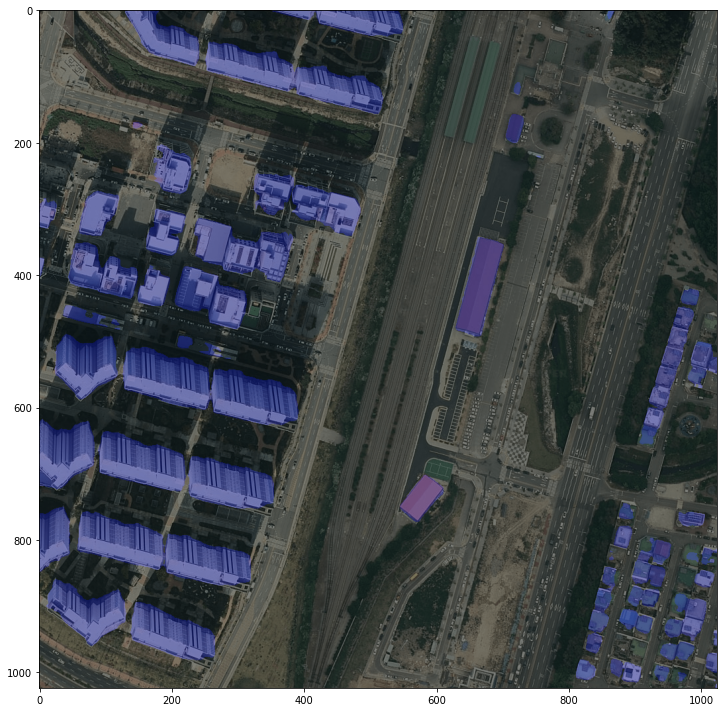

In [27]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0001.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/losses/cross_entropy_loss.py:236: UserWarning: Default ``avg_non_ignore`` is False, if you would like to ignore the certain label and average loss over non-ignore labels, which is the same with PyTorch official cross_entropy, set ``avg_non_ignore=True``.
  'Default ``avg_non_ignore`` is False, if you would like to '


load checkpoint from local path: /content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth


/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


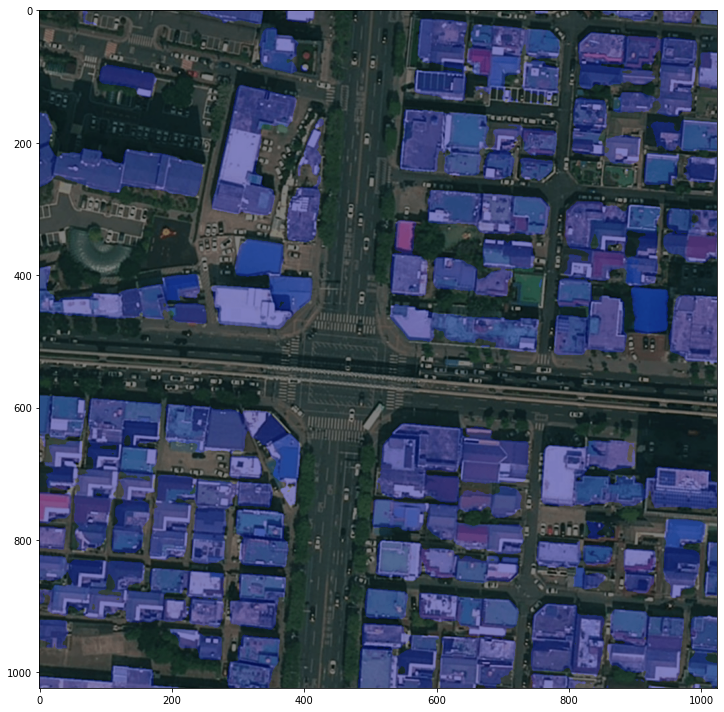

In [28]:
checkpoint_file = '/content/drive/MyDrive/SIA/semantic_checkpoint/Segformer/building/batch1_ce_dice/iter_20000.pth'  #학습된 모델

# checkpoint 저장된 model 파일을 이용하여 모델을 생성, 이때 Config는 위에서 update된 config 사용. 
model_ckpt = init_segmentor(cfg, checkpoint_file, device='cuda:0')  #cuda gpu 사용

img = mmcv.imread('/content/drive/MyDrive/SIA/naver_map_images/0002.png')
result = inference_segmentor(model_ckpt, img)
show_result_pyplot(model_ckpt, img, result, palette)

/content/mmsegmentation/mmseg/models/segmentors/base.py:289: UserWarning: show==False and out_file is not specified, only result image will be returned
  warnings.warn('show==False and out_file is not specified, only '


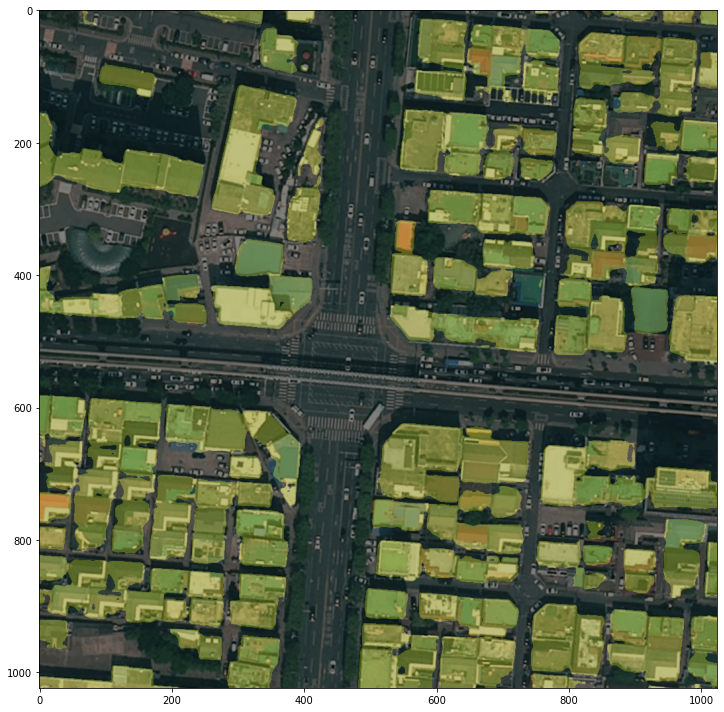

In [29]:
palette_1 = [[0, 0, 0], [128, 128, 0]]
show_result_pyplot(model_ckpt, img, result, palette_1)
